In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#!pip install 'git+https://github.com/facebookresearch/pytorch3d.git'
%cd /usr/local/lib/python3.7/dist-packages/
# !cp "/content/drive/Shareddrives/CIS581 - Final Project/colab-packages.zip" 
!cp "/content/drive/MyDrive/Files/colab-packages-not-pro.zip" "colab-packages.zip"
! unzip colab-packages.zip
%cd "/content/drive/MyDrive/Files/"

/usr/local/lib/python3.7/dist-packages
Archive:  colab-packages.zip
   creating: PyYAML-6.0.dist-info/
  inflating: PyYAML-6.0.dist-info/top_level.txt  
  inflating: PyYAML-6.0.dist-info/LICENSE  
  inflating: PyYAML-6.0.dist-info/WHEEL  
  inflating: PyYAML-6.0.dist-info/METADATA  
  inflating: PyYAML-6.0.dist-info/RECORD  
 extracting: PyYAML-6.0.dist-info/INSTALLER  
   creating: portalocker/
  inflating: portalocker/portalocker.py  
  inflating: portalocker/exceptions.py  
  inflating: portalocker/redis.py    
 extracting: portalocker/py.typed    
  inflating: portalocker/__about__.py  
   creating: portalocker/__pycache__/
  inflating: portalocker/__pycache__/exceptions.cpython-37.pyc  
  inflating: portalocker/__pycache__/utils.cpython-37.pyc  
  inflating: portalocker/__pycache__/constants.cpython-37.pyc  
  inflating: portalocker/__pycache__/redis.cpython-37.pyc  
  inflating: portalocker/__pycache__/portalocker.cpython-37.pyc  
  inflating: portalocker/__pycache__/__about__.cp

In [3]:
!pip install scikit-video
!pip install sk-video

shell-init: error retrieving current directory: getcwd: cannot access parent directories: No such file or directory
shell-init: error retrieving current directory: getcwd: cannot access parent directories: No such file or directory
The folder you are executing pip from can no longer be found.
     |████████████████████████████████| 2.3 MB 5.2 MB/s 


In [4]:
import pytorch3d
import torch

In [5]:
from pytorch3d.io import load_obj
from pytorch3d.structures import Meshes
from pytorch3d.renderer import (TexturesAtlas, 
                                MeshRasterizer,
                                FoVPerspectiveCameras,
                                PerspectiveCameras,
                                RasterizationSettings,
                                SoftPhongShader,
                                MeshRenderer,
                                look_at_view_transform)
import matplotlib.pyplot as plt
from PIL import Image
import skvideo.io

In [6]:
pip install mediapipe opencv-python # install dependencies

     |████████████████████████████████| 32.7 MB 171 kB/s 


In [7]:
import mediapipe as mp
import cv2
from google.colab import files
from google.colab.patches import cv2_imshow
import math
import numpy as np
from skimage import img_as_ubyte
import os
import google
from math import pi

In [8]:
cd '/content/drive/MyDrive/CIS 581 - Final Project Files'

/content/drive/.shortcut-targets-by-id/11Qis-Xxrv2Zb-iVBR2DT8678tVXM69H0/CIS 581 - Final Project Files


In [9]:
# Import drawing_utils and drawing_styles.
mp_drawing = mp.solutions.drawing_utils # the drawing utilities
mp_holistic = mp.solutions.holistic # the model we want to use (holistic) 
mp_face_mesh = mp.solutions.face_mesh # the model we want to test (face mesh, also part of holistic) 
mp_drawing_styles = mp.solutions.drawing_styles
mp_pose = mp.solutions.pose # the model we want to test because the computation will be faster (also a part of holistic)
mp_drawing.DrawingSpec(color=(255,0,255), thickness=2, circle_radius=2) # styling the dots the way I want them
mp_drawing.draw_landmarks # another line for styling

<function mediapipe.python.solutions.drawing_utils.draw_landmarks>

# (NECESSARY) Get Rigid Transform (R & t) Between two Meshes

In [10]:
def rigid_transform_3D(A, B):
    '''
    This function is designed to take 2 SIMILAR 3D point clouds A,B and estimate their respective transformation between them (rotation + translation)
    This is done by calculating the centroid, aligning the centroids (translation), and then using least squares to estimate rotation.
      Input: expects 3xN matrix of points
      Returns R,t
      R = 3x3 rotation matrix
      t = 3x1 column vector
    '''
    assert A.shape == B.shape

    num_rows, num_cols = A.shape
    if num_rows != 3:
        raise Exception(f"matrix A is not 3xN, it is {num_rows}x{num_cols}")

    num_rows, num_cols = B.shape
    if num_rows != 3:
        raise Exception(f"matrix B is not 3xN, it is {num_rows}x{num_cols}")

    # find mean column wise
    centroid_A = np.mean(A, axis=1)
    centroid_B = np.mean(B, axis=1)

    # ensure centroids are 3x1
    centroid_A = centroid_A.reshape(-1, 1)
    centroid_B = centroid_B.reshape(-1, 1)

    # subtract mean
    Am = A - centroid_A
    Bm = B - centroid_B

    H = Am @ np.transpose(Bm)

    # find rotation
    U, S, Vt = np.linalg.svd(H)
    R = Vt.T @ U.T

    # special reflection case
    if np.linalg.det(R) < 0:
        print("det(R) < R, reflection detected!, correcting for it ...")
        Vt[2,:] *= -1
        R = Vt.T @ U.T

    t = -R @ centroid_A + centroid_B

    return R, t

In [ ]:
#Use function if reducing image resolution is desired
DESIRED_HEIGHT = 480
DESIRED_WIDTH = 480
def resize_and_show(image):
  h, w = image.shape[:2]
  if h < w:
    img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
  else:
    img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
  return img
  cv2_imshow(img)

# (TESTING) FaceMesh and getting Rotation/Translation For a Pair of Images

## Original

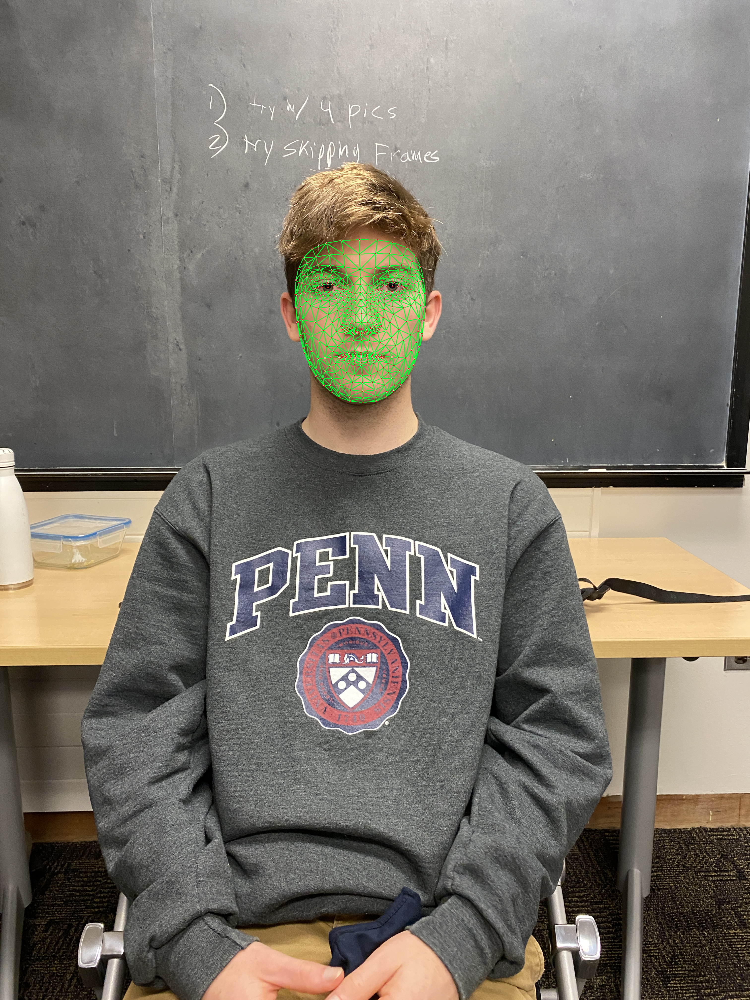

(3, 468)


In [ ]:
frames = []
coords = []
xcoords = []
ycoords = []
zcoords = []
image = cv2.imread("/content/drive/Shareddrives/CIS581 - Final Project/Nicks_Mugshots/nick_OG.JPG")
# Run MediaPipe Face Mesh.
with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    refine_landmarks=True,
    max_num_faces=2,
    min_detection_confidence=0.5) as face_mesh:
  #for name, image in images.items():
  for i in range(1):
    # Convert the BGR image to RGB and process it with MediaPipe Face Mesh.
    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Draw face landmarks of each face.
    if not results.multi_face_landmarks:
      continue
    annotated_image = image.copy()
    for face_landmarks in results.multi_face_landmarks:
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_TESSELATION,
          landmark_drawing_spec=mp_drawing.DrawingSpec(color=(0, 0, 255), circle_radius=1),
          connection_drawing_spec=mp_drawing.DrawingSpec(color=(50,255,0)))
    

    ##resize_and_show(annotated_image)
    # cv2_imshow(annotated_image)
    # # for point in range(20,40): 
    # point=4
    # print("Point number: ", point)
    # xcoor = int(results.multi_face_landmarks[0].landmark[point].x * annotated_image.shape[1])
    # ycoor = int(results.multi_face_landmarks[0].landmark[point].y * annotated_image.shape[0])

    # img = cv2.circle(annotated_image, (xcoor, ycoor), radius = 3, color = (255,0,0), thickness = -1)
    # # cv2.circle(annotated_image, (xcoor+5, ycoor+15), radius = 3, color = (0,0,255), thickness = -1)
    # print(results.multi_face_landmarks[0].landmark[0])
    # cv2_imshow(img)

    for LANDMARK in range(468):
      xcoords.append(results.multi_face_landmarks[0].landmark[LANDMARK].x)
      ycoords.append(results.multi_face_landmarks[0].landmark[LANDMARK].y)
      zcoords.append(results.multi_face_landmarks[0].landmark[LANDMARK].z)

    xcoords = np.array(xcoords)
    ycoords = np.array(ycoords)
    zcoords = np.array(zcoords)

    frame_coords_og = np.vstack((-xcoords, ycoords, zcoords))
    print(frame_coords_og.shape)

    # cv2.circle(image, (int(results.multi_face_landmarks[0].landmark[0].y*DESIRED_HEIGHT), int(results.multi_face_landmarks[0].landmark[0].x)*DESIRED_WIDTH), 1000, (255,0,0), thickness=1)

## Offset image

In [ ]:
frames = []
coords = []
xcoords = []
ycoords = []
zcoords = []
# image = cv2.imread("/content/drive/Shareddrives/CIS581 - Final Project/Nicks_Mugshots/nick_left_tilt.JPG")
image = cv2.imread("/content/drive/Shareddrives/CIS581 - Final Project/Nicks_Mugshots/nick_left.JPG")

# Run MediaPipe Face Mesh.
with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    refine_landmarks=True,
    max_num_faces=2,
    min_detection_confidence=0.5) as face_mesh:
  #for name, image in images.items():
  for i in range(1):
    # Convert the BGR image to RGB and process it with MediaPipe Face Mesh.
    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Draw face landmarks of each face.
    if not results.multi_face_landmarks:
      print("con")
      continue
    annotated_image = image.copy()
    for face_landmarks in results.multi_face_landmarks:
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_TESSELATION,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_tesselation_style())

    # # resize_and_show(annotated_image)
    # #cv2_imshow(annotated_image)
    # for point in range(468): 
    # # point=4
    #   print("Point number: ", point)
    #   xcoor = int(results.multi_face_landmarks[0].landmark[point].x * annotated_image.shape[1])
    #   ycoor = int(results.multi_face_landmarks[0].landmark[point].y * annotated_image.shape[0])

    #   img = cv2.circle(annotated_image, (xcoor, ycoor), radius = 3, color = (255,0,0), thickness = -1)
    #   # cv2.circle(annotated_image, (xcoor+5, ycoor+15), radius = 3, color = (0,0,255), thickness = -1)
    #   print(results.multi_face_landmarks[0].landmark[0])
    #   img = cv2.resize(img, (480,480))
    #   cv2_imshow(img)

    for LANDMARK in range(468):
      xcoords.append(results.multi_face_landmarks[0].landmark[LANDMARK].x)
      ycoords.append(results.multi_face_landmarks[0].landmark[LANDMARK].y)
      zcoords.append(results.multi_face_landmarks[0].landmark[LANDMARK].z)

    xcoords = np.array(xcoords)
    ycoords = np.array(ycoords)
    zcoords = np.array(zcoords)

    frame_coords_dir = np.vstack((-xcoords, ycoords, zcoords))
    print(frame_coords_dir.shape)

    # cv2.circle(image, (int(results.multi_face_landmarks[0].landmark[0].y*DESIRED_HEIGHT), int(results.multi_face_landmarks[0].landmark[0].x)*DESIRED_WIDTH), 1000, (255,0,0), thickness=1)

(3, 468)


## Get the transformation parameters (rotation and translation) for testing

In [ ]:
# PLEASE_WORK = rigid_transform_3D(frame_coords_dir[:,:], frame_coords_og[:,:])
PLEASE_WORK = rigid_transform_3D(frame_coords_og[:,:], frame_coords_dir[:,:])
print(PLEASE_WORK)

(array([[ 6.40860532e-01,  4.76527681e-02, -7.66176867e-01],
       [-3.12853127e-02,  9.98863531e-01,  3.59565672e-02],
       [ 7.67019561e-01,  9.26938099e-04,  6.41623046e-01]]), array([[-0.1595303 ],
       [ 0.02105612],
       [ 0.3687745 ]]))


In [ ]:
torch.cuda.is_available()

True

#(TESTING) Apply Rotation to 3D model

## Run the following for "Shifted Axes"*italicized text*

<class 'pytorch3d.structures.meshes.Meshes'>


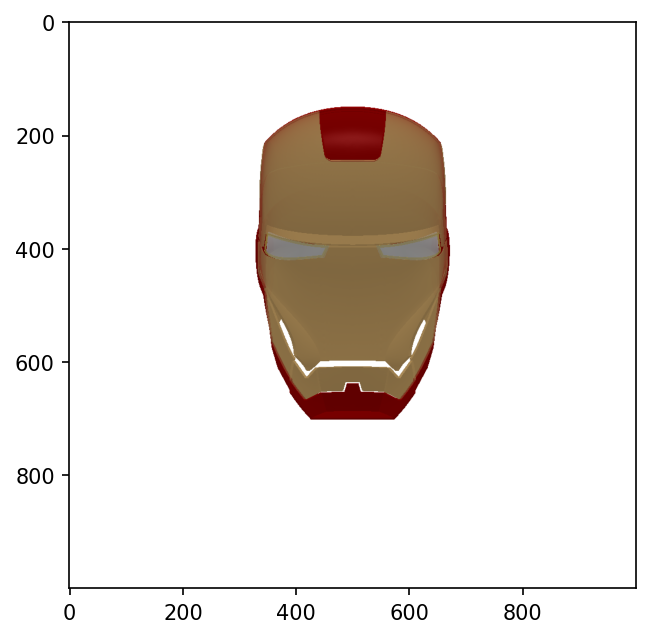

In [ ]:
filename = "/content/drive/Shareddrives/CIS581 - Final Project/3D object files/Iron_Man_shiftedoriginandaxes/Iron_Man.obj" # Messed Up Axes
device = torch.device("cuda")
# torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

verts, faces, aux = load_obj(filename, load_textures=True, create_texture_atlas=True, device=device)
atlas = aux.texture_atlas
mesh = Meshes(verts=[verts], faces=[faces.verts_idx], textures=TexturesAtlas(atlas=[atlas]))
print(type(mesh))
R, T = look_at_view_transform(dist=0.3, elev=0, azim=0)
cameras = FoVPerspectiveCameras(R=R, T=T, zfar=400, znear=0.1)
raster_settings = RasterizationSettings(image_size=(1000, 1000), blur_radius=0, faces_per_pixel =5)
rasterizer = MeshRasterizer(cameras = cameras, raster_settings = raster_settings).to(device)
shader = SoftPhongShader(cameras=cameras, device=device)
renderer = MeshRenderer(rasterizer, shader)

out = renderer(mesh)
img = out[0, ..., :3].cpu()
plt.figure(figsize=(5, 5), dpi=150)
plt.imshow(img)
plt.show()

## Run the following for Daft Punk

<class 'pytorch3d.structures.meshes.Meshes'>


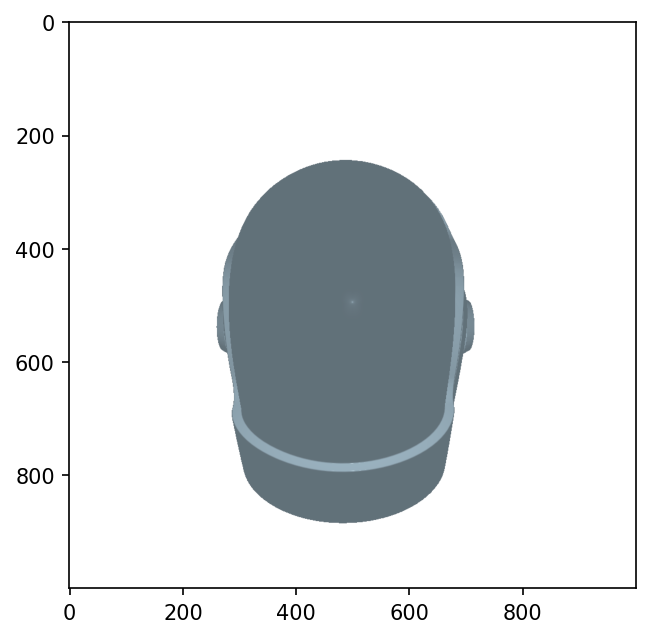

In [ ]:
filename = "/content/drive/Shareddrives/CIS581 - Final Project/3D object files/DaftPunkHelmet_Gold/Daft Punk Helmet.obj" # Messed Up Axes
device = torch.device("cuda")
# torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

verts, faces, aux = load_obj(filename, load_textures=True, create_texture_atlas=True, device=device)
atlas = aux.texture_atlas
mesh = Meshes(verts=[verts], faces=[faces.verts_idx], textures=TexturesAtlas(atlas=[atlas]))
print(type(mesh))
R, T = look_at_view_transform(dist=200, elev=0, azim=0)
cameras = FoVPerspectiveCameras(R=R, T=T, zfar=400, znear=0.1)
raster_settings = RasterizationSettings(image_size=(1000, 1000), blur_radius=0, faces_per_pixel =5)
rasterizer = MeshRasterizer(cameras = cameras, raster_settings = raster_settings).to(device)
shader = SoftPhongShader(cameras=cameras, device=device)
renderer = MeshRenderer(rasterizer, shader)

out = renderer(mesh)
img = out[0, ..., :3].cpu()
plt.figure(figsize=(5, 5), dpi=150)
plt.imshow(img)
plt.show()

In [ ]:
!pip show pytorch3d

Name: pytorch3d
Version: 0.6.0
Summary: PyTorch3D is FAIR's library of reusable components for deep Learning with 3D data.
Home-page: https://github.com/facebookresearch/pytorch3d
Author: FAIR
Author-email: None
License: UNKNOWN
Location: /usr/local/lib/python3.7/dist-packages
Requires: iopath, fvcore
Required-by: 


OG


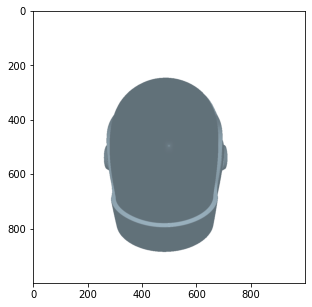

After rotation


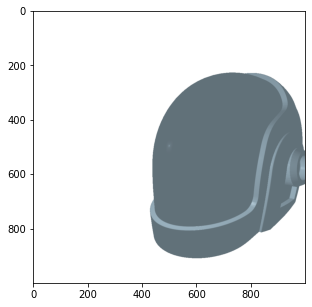

uint32


In [ ]:
aa_np = np.array([0,0.1,-pi/3]) # axis-angle matrix,(about x, y and z axes respectively)

R_np = PLEASE_WORK[0]
tran_np = np.array([0.1,0,0]) # Translation vector
point_np = np.array([0,1,0])  # 3d point

device = torch.device("cpu")

aa = torch.from_numpy(aa_np).float()
p = torch.from_numpy(point_np).float()
R = torch.from_numpy(R_np).float()
# R = pytorch3d.transforms.axis_angle_to_matrix(aa)
tran = torch.from_numpy(tran_np).float().to(device)

q_mat = pytorch3d.transforms.matrix_to_quaternion(R).to(device)
q_aar = pytorch3d.transforms.axis_angle_to_quaternion(aa)

rot_point_mat = pytorch3d.transforms.quaternion_apply(q_mat,p)
rot_point_aar = pytorch3d.transforms.quaternion_apply(q_aar,p)

mesh_vert_out = pytorch3d.transforms.quaternion_apply(q_mat,mesh.verts_list()[0])
print("OG")
out = renderer(mesh)
img = out[0, ..., :3].cpu()
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.show()

print("After rotation")
for i in range(1):
  # print(i/100.0)
  tran_np = np.array([0,0,0]) # [right-left,back-front,up-down] +ve -ve
  tran = torch.from_numpy(tran_np).float().to(device)
  # mesh_vert_out += tran
  pytorch3d.transforms.Scale
  mesh_out = Meshes(verts=[mesh_vert_out], faces=mesh.faces_list(), textures=TexturesAtlas(atlas=[atlas]))
  out = renderer(mesh_out)
  img = out[0, ..., :3].cpu().numpy()
  img = img * 255
  img = img.astype(np.uint32)
  plt.figure(figsize=(5, 5))
  plt.imshow(img)
  plt.show()
  print(img.dtype)

## (VIDEO) Calculating all of the Rotation and Translation Matrices

In [ ]:
cap = cv2.VideoCapture('/content/drive/Shareddrives/CIS581 - Final Project/Nicks_Mugshots/Nicks_Serial_Mugshots/test1.MOV')
frames = []
all_R = []
all_t = []
frame_cnt = 0 

# with mp_.Pose(min_detection_confidence=0.5,min_tracking_confidence=0.5) as pose:
with mp_face_mesh.FaceMesh(min_detection_confidence=0.5,min_tracking_confidence=0.5) as face_mesh:
  while cap.isOpened():
    # if frame_cnt == 3:
    #  break
    success, image = cap.read()
    image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)

    if frame_cnt%10 == 0:
      print("Frame: ", frame_cnt)

    if not success:
      print("Ignoring empty camera frame.")
      # If loading a video, use 'break' instead of 'continue'.
      break

    # Convert the BGR image to RGB and process it with MediaPipe Face Mesh.
    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    xcoords = []
    ycoords = []
    zcoords = []

    for LANDMARK in range(468):
      xcoords.append(results.multi_face_landmarks[0].landmark[LANDMARK].x)
      ycoords.append(results.multi_face_landmarks[0].landmark[LANDMARK].y)
      zcoords.append(results.multi_face_landmarks[0].landmark[LANDMARK].z)

    xcoords = np.array(xcoords)
    ycoords = np.array(ycoords)
    zcoords = np.array(zcoords)

    if frame_cnt == 0:
      frame_coords_prev = np.vstack((-xcoords, ycoords, zcoords))
    else:
      final_coords_new = np.vstack((-xcoords, ycoords, zcoords))
      R, t = rigid_transform_3D(frame_coords_prev, final_coords_new) # refer to nicks section of mugshots to see why it is in this orders

      all_R.append(R)
      all_t.append(t)
      frame_coords_prev = final_coords_new.copy()
    frame_cnt += 1

print("Final image frame count - ", frame_cnt)
print("Number of R matrices - ", len(all_R))
cv2.destroyAllWindows()
cap.release()

Frame:  0
Frame:  10
Frame:  20
Frame:  30
Frame:  40
Frame:  50
Frame:  60
Frame:  70
Frame:  80
Frame:  90
Frame:  100
Frame:  110
Frame:  120
Frame:  130
Frame:  140
Frame:  150
Frame:  160
Frame:  170
Frame:  180
Frame:  190
Frame:  200
Frame:  210
Frame:  220
Frame:  230
Frame:  240
Frame:  250
Frame:  260
Frame:  270
Frame:  280
Frame:  290
Frame:  300
Frame:  310
Frame:  320
Frame:  330
Frame:  340
Frame:  350
Frame:  360
Ignoring empty camera frame.
Final image frame count -  361
Number of R matrices -  360


In [ ]:
cv2.destroyAllWindows()
cap.release()

In [ ]:
all_R = np.array(all_R)
all_t = np.array(all_t)
# np.save("npy_files/final_rotation.npy", all_R)
# np.save("npy_files/final_trans.npy", all_t)

## Create a video of of the Iron Man Mask Following Rotation

In [ ]:
# all_R = np.load("/content/drive/Shareddrives/CIS581 - Final Project/npy_files/final_rotation.npy")
# all_t = np.load("/content/drive/Shareddrives/CIS581 - Final Project/npy_files/final_trans.npy")
device = torch.device("cuda")
all_img = []

####
mesh_prev = mesh.verts_list()[0]
####
i = 0
for R_np in all_R:
  point_np = np.array([0,1,0])  # 3d point
  p = torch.from_numpy(point_np).float()

  R = torch.from_numpy(R_np).float()
  q_mat = pytorch3d.transforms.matrix_to_quaternion(R).to(device)

  rot_point_mat = pytorch3d.transforms.quaternion_apply(q_mat, p)
  mesh_vert_out = pytorch3d.transforms.quaternion_apply(q_mat, mesh_prev)
  #####
  mesh_prev = mesh_vert_out.clone()
  #####
  
  # print("After rotation")
  pytorch3d.transforms.Scale
  mesh_out = Meshes(verts=[mesh_vert_out], faces=mesh.faces_list(), textures=TexturesAtlas(atlas=[atlas]))
  out = renderer(mesh_out)
  img = out[0, ..., :3].cpu().numpy()
  all_img.append(img)

  if i%20 == 0:
    print("Processing frame: ", i)
  i += 1


Processing frame:  0
Processing frame:  20
Processing frame:  40
Processing frame:  60
Processing frame:  80
Processing frame:  100
Processing frame:  120
Processing frame:  140
Processing frame:  160
Processing frame:  180
Processing frame:  200
Processing frame:  220
Processing frame:  240
Processing frame:  260
Processing frame:  280
Processing frame:  300
Processing frame:  320
Processing frame:  340


In [ ]:
import cv2
size = all_img[0].shape[:-1]
output = cv2.VideoWriter('/content/drive/Shareddrives/CIS581 - Final Project/video_outputs/final_test1_result_PUNK.mov',cv2.VideoWriter_fourcc(*'DIVX'), 15, size)
for i in range(len(all_img)):
  image_write = all_img[i] * 255
  image_write = image_write.astype(np.uint8)
  output.write(image_write)

output.release()

#(TESTING) Helmet Alignment

In [ ]:
#image = cv2.imread("/content/drive/Shareddrives/CIS581 - Final Project/Nicks_Mugshots/nick_right_tilt.JPG")
image = cv2.imread("/content/drive/Shareddrives/CIS581 - Final Project/Nicks_Mugshots/nick_OG.JPG")
#image = image = cv2.imread("/content/drive/Shareddrives/CIS581 - Final Project/Nicks_Mugshots/nick_right.JPG")

In [ ]:
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

In [ ]:
with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    refine_landmarks=True,
    max_num_faces=2,
    min_detection_confidence=0.5) as face_mesh:
    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) 
    annotated_image = image.copy()
    for face_landmarks in results.multi_face_landmarks:
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_TESSELATION,
          landmark_drawing_spec=mp_drawing.DrawingSpec(color=(0, 0, 255), circle_radius=1),
          connection_drawing_spec=mp_drawing.DrawingSpec(color=(50,255,0)))

In [ ]:
plt.rcParams["figure.figsize"] = (10,20)
plt.imshow(annotated_image[900:1700, 1200:2000, :])

In [ ]:
filename = "/content/drive/Shareddrives/CIS581 - Final Project/3D object files/Iron_Man_shiftedoriginandaxes/Iron_Man.obj"
#filename = "Iron_Man.obj"
device = torch.device("cuda")
# torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

verts, faces, aux = load_obj(filename, load_textures=True, create_texture_atlas=True, device=device)
#verts[:, 0] += .1
#verts[:, 1] += .1
#verts[:, 2] += .1
atlas = aux.texture_atlas
mesh = Meshes(verts=[verts.cuda()], faces=[faces.verts_idx], textures=TexturesAtlas(atlas=[atlas]))
print(type(mesh))
R, T = look_at_view_transform(dist=0.3, elev=0, azim=0)
#R = torch.eye(3).unsqueeze(0)
#T = torch.zeros_like(T)
cameras = PerspectiveCameras(R=R, T=T, focal_length=1)
raster_settings = RasterizationSettings(image_size=(2016, 1512), blur_radius=0, faces_per_pixel =2)
rasterizer = MeshRasterizer(cameras = cameras, raster_settings = raster_settings).to(device)
shader = SoftPhongShader(cameras=cameras, device=device)
renderer = MeshRenderer(rasterizer, shader)

out = renderer(mesh)
img = out[0, ..., :3].cpu()
plt.figure(figsize=(5, 5), dpi=150)
plt.imshow(img)
plt.show()

#(NECESSARY) Superimpose Code Here:

In [11]:
from scipy.ndimage import shift
def get_all_pairs(n):
  """ Returns all (one sided, nonrepeating) combinations of [0,n) and [0,n)
  For instance, get_all_pairs(3) -> [(0, 1), (0, 2), (1, 2)]
  Used by est_scale function
  """
  return [(i, j) for i in range(n) for j in range(i+1, n)]

def get_dist(a, b):
  return np.sqrt((a[0] - b[0])**2 + (a[1] - b[1])**2)


def est_scale(p1, p2):
  """ p1 and p2 are (n, 2) arrays of corresponding keypoint coords in 2d
  Current implementation is to return average of ratios of distances between each comination of keypoint pairs
  Other possible approaches:
    Return median ratio instead of average (in case some of the tiny distances yield inaccurate ratios)
    Use a single pair of keypoints, preferably ones that are unlikely to line up with each other onto the same pixel in an image (ex. left eye and left mouth corner could be good)
    Compute the bounding boxes of each set of keypoints and scale based on relative box sizes
  """
  n = p1.shape[0]
  dratios = []
  pair_inds = get_all_pairs(n)
  for i, j in pair_inds:
    d1 = get_dist(p1[i], p1[j])
    d2 = get_dist(p2[i], p2[j])
    dratios += [d1/d2]
  return sum(dratios) / len(dratios)

def get_denorm_landmarks(landmarks, img_dims, person_keypoint_inds):
  """ Takes in landmarks returned by mediapipe and scales them up to pixel coords using image dims"""
  person_keypoints = []
  for ind in person_keypoint_inds:
    p = landmarks[ind]
    person_keypoints.append([int(p.x * img_dims[1]), int(p.y * img_dims[0])])
  return np.array(person_keypoints)

def get_render_dims(img_dims, render_scale):
  """ returns image dimensions (to nearest integer) scaled by render_scale relative to original dimensions img_dims"""
  return (int(img_dims[0] * render_scale), int(img_dims[1] * render_scale))

def render(verts, face, aux, render_dims, look_at_view_transform_params):
  """ renders 3d mesh and returns rendered image and cameras object.
  look_at_view_transform_params: parameters of transformation: ex. {"dist": 0.3, "elev": 0, "azim": 0}
   """
  device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

  mesh = Meshes(verts=[verts.cuda()], faces=[faces.verts_idx], textures=TexturesAtlas(atlas=[aux.texture_atlas]))

  R, T = look_at_view_transform(**look_at_view_transform_params)
  cameras = PerspectiveCameras(R=R, T=T, focal_length=1)

  raster_settings = RasterizationSettings(image_size=render_dims, blur_radius=0, faces_per_pixel =2)
  rasterizer = MeshRasterizer(cameras = cameras, raster_settings = raster_settings).to(device)

  shader = SoftPhongShader(cameras=cameras, device=device)
  renderer = MeshRenderer(rasterizer, shader)

  out = renderer(mesh)
  img = out[0, ..., :3]
  img = (img * 255).int().cpu().numpy().astype(np.uint8)
  return img, cameras

def project_mesh_keypoints(verts, mesh3d_keypoint_inds, cameras, render_dims, mesh_keypoint_offset):
  device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

  mesh_keypoints_list = [verts[ind] for ind in mesh3d_keypoint_inds]
  mesh_keypoints = torch.stack(mesh_keypoints_list).unsqueeze(0).to(device)

  # apply specified offset
  mesh_keypoints[:, 0] -= mesh_keypoint_offset[0]
  mesh_keypoints[:, 1] -= mesh_keypoint_offset[1]
  mesh_keypoints[:, 2] -= mesh_keypoint_offset[2]

  proj_mesh_keypoints = cameras.transform_points_screen(mesh_keypoints, image_size=render_dims)
  proj_mesh_keypoints = proj_mesh_keypoints[0, :, :2].int().cpu().numpy()
  return proj_mesh_keypoints

def get_offset(p1, p2):
  return p2.mean(axis=0) - p1.mean(axis=0)

def get_render_mask(img_rend):
  return np.where(img_rend.sum(axis=2) < 255*3, 1, 0)


def superimpose(img, verts, faces, aux, landmarks, person_keypoint_inds, look_at_view_transform_params,
                mesh3d_keypoint_inds, scale_factor = False, render_scale=0.5, inflate_mesh=1.1, mesh_keypoint_offset = (0, 0, 0)):
  """ THIS IS THE MAIN FUNCTION HERE!
      img: video frame image (height, width, rgbchannels), uint8 (0-255) in RGB format (may need cv2 bgr2rgb conversion prior to this function call)
      verts, faces, aux: outputs of pytorch3d load_obj. Note that verts is assumed to have already been rotated into proper orientation
      landmarks: output of mediapipe (in default format: normalized by image dimensions) - output of: facemesh.process(...).multi_face_landmarks[0].landmark
      person_keypoints: list of the indices (not coords!) in the landmarks list that have been chosen as keypoints
      mesh3d_keypoint_inds: list of indices (not coords!) in the verts array that correspond to the landmark keypoints in person_keypoint_inds
      render_scale: how much of a smaller resolution to render the mesh at, relative to image size (1 means same size, 0.5 means render at half size)
      inflate_mesh: how much to increase the scale of the superimposed 3d mesh relative to the person (to hide tracking imperfections)
      mesh_keypoint_offset: shift keypoints relative to mesh (for instance to move the helmet a toward the front of the face to cover the nose). However this doesn't work very well since transformation is applied in world coords rather than mesh coord space.
  """
  img_dims = img.shape[:2]
  render_dims = get_render_dims(img_dims, render_scale)
  img_rend, cameras = render(verts, faces, aux, render_dims, look_at_view_transform_params)

  person_keypoints = get_denorm_landmarks(landmarks, img_dims, person_keypoint_inds)
  proj_mesh_keypoints = project_mesh_keypoints(verts, mesh3d_keypoint_inds, cameras, render_dims, mesh_keypoint_offset)

  # get scale ratio between keypoints on person and projected mesh keypoints (tells us how much rendered image needs to be scaled up)
  mesh_scale = est_scale(proj_mesh_keypoints, person_keypoints)
  inflate_factor = inflate_mesh * mesh_scale / render_scale

  # resize rendered image to compensate for scale differences (and potentially rendering at lower resolution)
  upsampled_render_dims = get_render_dims(render_dims, inflate_factor)
  upsampled_img_rend = cv2.resize(img_rend, upsampled_render_dims[::-1], 0, 0, interpolation=cv2.INTER_LINEAR)
  proj_mesh_keypoints = (proj_mesh_keypoints * inflate_factor).astype(int) # need to scale keypoint coordinates as well

  # find translation between centroids of mesh and person keypoints
  offset = get_offset(proj_mesh_keypoints, person_keypoints)
  # print("offset")
  # print(offset)
  shifted_upsampled_img_rend = shift(upsampled_img_rend, (offset[1], offset[0], 0), mode="constant", cval=255, order=0)
  #plt.imshow(shifted_upsampled_img_rend.astype(np.uint8))
  #plt.show()

  # create output array large enough to fit both target image and rescaled rendered image
  output = np.zeros((max(shifted_upsampled_img_rend.shape[0], img.shape[0]), 
                     max(shifted_upsampled_img_rend.shape[1], img.shape[1]), 
                     img.shape[2]))

  # generate masks for rendered & target images
  render_mask = get_render_mask(shifted_upsampled_img_rend)
  render_mask = np.stack([render_mask]*img.shape[2], axis=2).astype(np.uint8)
  inv_render_mask = 1 - render_mask

  # apply target image to output
  output[0:img.shape[0], 0:img.shape[1], :] = img

  # zero out the parts of the target image reserved for rendered image via mask
  output[0:inv_render_mask.shape[0], 0:inv_render_mask.shape[1], :] = output[0:inv_render_mask.shape[0], 0:inv_render_mask.shape[1], :] * inv_render_mask 

  # zero out unmasked portions of rendered image and apply to output 
  output[0:shifted_upsampled_img_rend.shape[0], 0:shifted_upsampled_img_rend.shape[1], :] += shifted_upsampled_img_rend * render_mask 

  output = output[0:img.shape[0], 0:img.shape[1], :].astype(np.uint8)
  return output


#(FINAL OUTPUT) Superimpose Video Frames

In [13]:
vidpath = '/content/drive/MyDrive/CIS 581 - Final Project Files/Output Video 1/test1.MOV'

In [25]:
IM_OBJ = "/content/drive/MyDrive/CIS 581 - Final Project Files/3D MODEL/Iron_Man.obj"
device = torch.device("cuda")

verts, faces, aux = load_obj(IM_OBJ, load_textures=True, create_texture_atlas=True, device=device)
atlas = aux.texture_atlas
mesh = Meshes(verts=[verts], faces=[faces.verts_idx], textures=TexturesAtlas(atlas=[atlas]))

helmet_inds_list = [1390, 3988, 1714, 4314, 90310, 95385]  # indices of face landmark keypoints
face_inds_list = [33, 359, 155, 398, 61, 273] # indices of keypoint mesh vertices
# order is: outer right eye corner, outer left eye corner, inner right eye corner, inner left eye corner, right mouth corner, left mouth corner (where lefts and rights are from perspective of the human in the image, not the image viewer)

cam_params = {"dist": 0.35, "elev": 0, "azim":0}

### Get FaceMesh Landmarks, Video Stills, Rotation, and translation (translation not used) 

In [15]:
def get_vid_RtLF(vidpath):
  cap = cv2.VideoCapture(vidpath)
  frames = []
  all_R = []
  all_t = []
  all_results = []
  all_img = []
  frame_cnt = 0 

  with mp_face_mesh.FaceMesh(min_detection_confidence=0.5,min_tracking_confidence=0.5) as face_mesh:
    while cap.isOpened():
      # if frame_cnt == 90:
      #   break
      success, image = cap.read()

      if frame_cnt%10 == 0:
        print("Frame: ", frame_cnt)

      if not success:
        print("Ignoring empty camera frame.")
        # If loading a video, use 'break' instead of 'continue'.
        break

      image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

      # Convert the BGR image to RGB and process it with MediaPipe Face Mesh.
      results = face_mesh.process(image)
      all_results.append(results)

      xcoords = []
      ycoords = []
      zcoords = []

      for LANDMARK in range(468):
        xcoords.append(results.multi_face_landmarks[0].landmark[LANDMARK].x)
        ycoords.append(results.multi_face_landmarks[0].landmark[LANDMARK].y)
        zcoords.append(results.multi_face_landmarks[0].landmark[LANDMARK].z)

      xcoords = np.array(xcoords)
      ycoords = np.array(ycoords)
      zcoords = np.array(zcoords)

      #correct the difference in x and y-axis scaling (z-axis follows x scale)
      aspect_ratio = image.shape[1]/image.shape[0]
      ycoords *= aspect_ratio

      if frame_cnt == 0:
        frame_coords_prev = np.vstack((-xcoords, ycoords, zcoords))
      else:
        final_coords_new = np.vstack((-xcoords, ycoords, zcoords))
        R, t = rigid_transform_3D(frame_coords_prev, final_coords_new)
        
        all_R.append(R)
        all_t.append(t)
        all_img.append(image)
        frame_coords_prev = final_coords_new.copy()

      frame_cnt += 1

  print("Final image frame count - ", frame_cnt)
  print("Number of R matrices - ", len(all_R))
  cv2.destroyAllWindows()
  cap.release()

  return all_R, all_t, all_results, all_img

In [16]:
def transform_verts(verts, Rot):
  R = torch.from_numpy(Rot).float()
  q_mat = pytorch3d.transforms.matrix_to_quaternion(R).to(device)
  mesh_vert_out = pytorch3d.transforms.quaternion_apply(q_mat, verts)
    
  return mesh_vert_out

###Generate List of Superimposed Image Frames

In [26]:
super_imgs = []
rotated_verts = verts.clone()

R_all, _, all_results, all_images = get_vid_RtLF(vidpath)

for i in range(len(R_all)):
  results = all_results[i]
  superimposed_img = superimpose(all_images[i], rotated_verts, faces, aux, results.multi_face_landmarks[0].landmark, 
            face_inds_list, cam_params, helmet_inds_list, render_scale=0.5, inflate_mesh=2.8)
  super_imgs.append(superimposed_img)
  rotated_verts = transform_verts(rotated_verts, R_all[i])
  print(f"Superimposing Frame {i}")

Frame:  0
Frame:  10
Frame:  20
Frame:  30
Frame:  40
Frame:  50
Frame:  60
Frame:  70
Frame:  80
Frame:  90
Frame:  100
Frame:  110
Frame:  120
Frame:  130
Frame:  140
Frame:  150
Frame:  160
Frame:  170
Frame:  180
Frame:  190
Frame:  200
Frame:  210
Frame:  220
Frame:  230
Frame:  240
Frame:  250
Frame:  260
Frame:  270
Frame:  280
Frame:  290
Frame:  300
Frame:  310
Frame:  320
Frame:  330
Frame:  340
Frame:  350
Frame:  360
Ignoring empty camera frame.
Final image frame count -  361
Number of R matrices -  360
Superimposing Frame 0
Superimposing Frame 1
Superimposing Frame 2
Superimposing Frame 3
Superimposing Frame 4
Superimposing Frame 5
Superimposing Frame 6
Superimposing Frame 7
Superimposing Frame 8
Superimposing Frame 9
Superimposing Frame 10
Superimposing Frame 11
Superimposing Frame 12
Superimposing Frame 13
Superimposing Frame 14
Superimposing Frame 15
Superimposing Frame 16
Superimposing Frame 17
Superimposing Frame 18
Superimposing Frame 19
Superimposing Frame 20
Superi

###Write Superimposed frames to MP4

In [27]:
#WRITE TO MP4
out_video =  np.array(super_imgs)
out_video =  out_video.astype(np.uint8)
# Writes the the output image sequences in a video file
skvideo.io.vwrite('/content/drive/MyDrive/CIS 581 - Final Project Files/Output Video 1/NEW_RESULT.mp4', out_video)